<a href="https://colab.research.google.com/github/Tony607/object_detection_demo/blob/master/tensorflow_object_detection_training_colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# [How to train an object detection model easy for free](https://www.dlology.com/blog/how-to-train-an-object-detection-model-easy-for-free/) | DLology Blog

## Configs and Hyperparameters

Support a variety of models, you can find more pretrained model from [Tensorflow detection model zoo: COCO-trained models](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/detection_model_zoo.md#coco-trained-models), as well as their pipline config files in [object_detection/samples/configs/](https://github.com/tensorflow/models/tree/master/research/object_detection/samples/configs).

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip3 install tensorflow==1.15.0

     |████████████████████████████████| 412.3MB 42kB/s 
     |████████████████████████████████| 3.8MB 52.9MB/s 
     |████████████████████████████████| 512kB 50.8MB/s 
     |████████████████████████████████| 51kB 7.9MB/s 
  Created wheel for gast: filename=gast-0.2.2-cp36-none-any.whl size=7542 sha256=6bf7cb37b03eea709eb68ebc84519f3d799a8327c571f395643eb23c25fd1f9b
  Stored in directory: /root/.cache/pip/wheels/5c/2e/7e/a1d4d4fcebe6c381f378ce7743a3ced3699feb89bcfbdadadd
Successfully built gast
ERROR: tensorflow-probability 0.11.0 has requirement gast>=0.3.2, but you'll have gast 0.2.2 which is incompatible.
  Found existing installation: gast 0.3.3
    Uninstalling gast-0.3.3:
      Successfully uninstalled gast-0.3.3
  Found existing installation: tensorboard 2.3.0
    Uninstalling tensorboard-2.3.0:
      Successfully uninstalled tensorboard-2.3.0
  Found existing installation: tensorflow-estimator 2.3.0
    Uninstalling tensorflow-estimator-2.3.0:
      Successfully uninstalled tens

In [3]:
!pip install --upgrade tf-slim

     |████████████████████████████████| 358kB 4.8MB/s 


In [4]:
!pip freeze > requirements.txt

In [71]:
# If you forked the repository, you can replace the link.
repo_url = '/content/drive/My Drive/Colab Notebooks/olektra AI /projects/Currents projects/arginnovatice_rice/object_detection_demo'

# Number of training steps.
num_steps = 200000  # 200000

# Number of evaluation steps.
num_eval_steps = 100

MODELS_CONFIG = {
    'ssd_mobilenet_v2': {
        'model_name': 'ssd_mobilenet_v2_coco_2018_03_29',
        'pipeline_file': 'ssd_mobilenet_v2_coco.config',
        'batch_size': 128
    },
    'faster_rcnn_inception_v2': {
        'model_name': 'faster_rcnn_inception_v2_coco_2018_01_28',
        'pipeline_file': 'faster_rcnn_inception_v2_pets.config',
        'batch_size': 12
    },
    'rfcn_resnet101': {
        'model_name': 'rfcn_resnet101_coco_2018_01_28',
        'pipeline_file': 'rfcn_resnet101_pets.config',
        'batch_size': 8
    }
}

# Pick the model you want to use
# Select a model in `MODELS_CONFIG`.
selected_model = 'ssd_mobilenet_v2'

# Name of the object detection model to use.
MODEL = MODELS_CONFIG[selected_model]['model_name']

# Name of the pipline file in tensorflow object detection API.
pipeline_file = MODELS_CONFIG[selected_model]['pipeline_file']

# Training batch size fits in Colabe's Tesla K80 GPU memory for selected model.
batch_size = MODELS_CONFIG[selected_model]['batch_size']

## Clone the `object_detection_demo` repository or your fork.

In [6]:
!ls

drive  requirements.txt  sample_data


In [7]:
import os

%cd /content/drive/My Drive/Colab Notebooks/olektra AI /projects/Currents projects/arginnovatice_rice/content

repo_dir_path = repo_url #os.path.abspath(os.path.join('.', os.path.basename(repo_url)))

# !git clone {repo_url}
%cd {repo_dir_path}
# !git pull

/content/drive/My Drive/Colab Notebooks/olektra AI /projects/Currents projects/arginnovatice_rice/content
/content/drive/My Drive/Colab Notebooks/olektra AI /projects/Currents projects/arginnovatice_rice/object_detection_demo


## Install required packages

In [8]:
%cd /content/drive/My Drive/Colab Notebooks/olektra AI /projects/Currents projects/arginnovatice_rice/content
!git clone --quiet https://github.com/tensorflow/models.git

!apt-get install -qq protobuf-compiler python-pil python-lxml python-tk

!pip install -q Cython contextlib2 pillow lxml matplotlib

!pip install -q pycocotools

%cd /content/drive/My Drive/Colab Notebooks/olektra AI /projects/Currents projects/arginnovatice_rice/content/models/research
!protoc object_detection/protos/*.proto --python_out=.

import os
os.environ['PYTHONPATH'] += ':/content/drive/My Drive/Colab Notebooks/olektra AI /projects/Currents projects/arginnovatice_rice/content/models/research/:/content/drive/My Drive/Colab Notebooks/olektra AI /projects/Currents projects/arginnovatice_rice/content/models/research/slim/:/content/drive/My Drive/Colab Notebooks/olektra AI /projects/Currents projects/arginnovatice_rice/content/'

!python object_detection/builders/model_builder_test.py

/content/drive/My Drive/Colab Notebooks/olektra AI /projects/Currents projects/arginnovatice_rice/content
fatal: destination path 'models' already exists and is not an empty directory.
Selecting previously unselected package python-bs4.
(Reading database ... 144676 files and directories currently installed.)
Preparing to unpack .../0-python-bs4_4.6.0-1_all.deb ...
Unpacking python-bs4 (4.6.0-1) ...
Selecting previously unselected package python-pkg-resources.
Preparing to unpack .../1-python-pkg-resources_39.0.1-2_all.deb ...
Unpacking python-pkg-resources (39.0.1-2) ...
Selecting previously unselected package python-chardet.
Preparing to unpack .../2-python-chardet_3.0.4-1_all.deb ...
Unpacking python-chardet (3.0.4-1) ...
Selecting previously unselected package python-six.
Preparing to unpack .../3-python-six_1.11.0-2_all.deb ...
Unpacking python-six (1.11.0-2) ...
Selecting previously unselected package python-webencodings.
Preparing to unpack .../4-python-webencodings_0.5-2_all.deb

In [9]:
!protoc --version

libprotoc 3.0.0


## Prepare `tfrecord` files

Use the following scripts to generate the `tfrecord` files.
```bash
# Convert train folder annotation xml files to a single csv file,
# generate the `label_map.pbtxt` file to `data/` directory as well.
python xml_to_csv.py -i data/images/train -o data/annotations/train_labels.csv -l data/annotations

# Convert test folder annotation xml files to a single csv.
python xml_to_csv.py -i data/images/test -o data/annotations/test_labels.csv

# Generate `train.record`
python generate_tfrecord.py --csv_input=data/annotations/train_labels.csv --output_path=data/annotations/train.record --img_path=data/images/train --label_map data/annotations/label_map.pbtxt

# Generate `test.record`
python generate_tfrecord.py --csv_input=data/annotations/test_labels.csv --output_path=data/annotations/test.record --img_path=data/images/test --label_map data/annotations/label_map.pbtxt
```

In [ ]:
%cd {repo_dir_path}

/content/drive/My Drive/Colab Notebooks/olektra AI /projects/Currents projects/arginnovatice_rice/object_detection_demo


In [ ]:
!python xml_to_csv.py -i data/images/train -o data/annotations/train_labels.csv -l data/annotations

Successfully converted xml to csv.
Generate `data/annotations/label_map.pbtxt`


In [ ]:
!python xml_to_csv.py -i data/images/test -o data/annotations/test_labels.csv

Successfully converted xml to csv.


In [ ]:
!python generate_tfrecord.py --csv_input=data/annotations/train_labels.csv --output_path=data/annotations/train.record --img_path=data/images/train --label_map data/annotations/label_map.pbtxt



W0923 09:28:58.307111 139996735125376 module_wrapper.py:139] From generate_tfrecord.py:107: The name tf.python_io.TFRecordWriter is deprecated. Please use tf.io.TFRecordWriter instead.


W0923 09:28:58.663192 139996735125376 module_wrapper.py:139] From generate_tfrecord.py:53: The name tf.gfile.GFile is deprecated. Please use tf.io.gfile.GFile instead.

Successfully created the TFRecords: /content/drive/My Drive/Colab Notebooks/olektra AI /projects/Currents projects/arginnovatice_rice/object_detection_demo/data/annotations/train.record


In [ ]:
!python generate_tfrecord.py --csv_input=data/annotations/test_labels.csv --output_path=data/annotations/test.record --img_path=data/images/test --label_map data/annotations/label_map.pbtxt



W0923 09:29:06.230947 139855187797888 module_wrapper.py:139] From generate_tfrecord.py:107: The name tf.python_io.TFRecordWriter is deprecated. Please use tf.io.TFRecordWriter instead.


W0923 09:29:06.258118 139855187797888 module_wrapper.py:139] From generate_tfrecord.py:53: The name tf.gfile.GFile is deprecated. Please use tf.io.gfile.GFile instead.

Successfully created the TFRecords: /content/drive/My Drive/Colab Notebooks/olektra AI /projects/Currents projects/arginnovatice_rice/object_detection_demo/data/annotations/test.record


In [ ]:


# Convert train folder annotation xml files to a single csv file,
# generate the `label_map.pbtxt` file to `data/` directory as well.
# !python xml_to_csv.py -i data/images/train -o data/annotations/train_labels.csv -l data/annotations

# # Convert test folder annotation xml files to a single csv.
# !python xml_to_csv.py -i data/images/test -o data/annotations/test_labels.csv

# # Generate `train.record`
# !python generate_tfrecord.py --csv_input=data/annotations/train_labels.csv --output_path=data/annotations/train.record --img_path=data/images/train --label_map data/annotations/label_map.pbtxt

# # Generate `test.record`
# !python generate_tfrecord.py --csv_input=data/annotations/test_labels.csv --output_path=data/annotations/test.record --img_path=data/images/test --label_map data/annotations/label_map.pbtxt

In [10]:
test_record_fname = '/content/drive/My Drive/Colab Notebooks/olektra AI /projects/Currents projects/arginnovatice_rice/object_detection_demo/data/annotations/test.record'
train_record_fname = '/content/drive/My Drive/Colab Notebooks/olektra AI /projects/Currents projects/arginnovatice_rice/object_detection_demo/data/annotations/train.record'
label_map_pbtxt_fname = '/content/drive/My Drive/Colab Notebooks/olektra AI /projects/Currents projects/arginnovatice_rice/object_detection_demo/data/annotations/label_map.pbtxt'

## Download base model

In [77]:
%cd /content/drive/My Drive/Colab Notebooks/olektra AI /projects/Currents projects/arginnovatice_rice/content/models/research

import os
import shutil
import glob
import urllib.request
import tarfile
MODEL_FILE = MODEL + '.tar.gz'
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/'
DEST_DIR = '/content/drive/My Drive/Colab Notebooks/olektra AI /projects/Currents projects/arginnovatice_rice/content/models/research/pretrained_model'

if not (os.path.exists(MODEL_FILE)):
    urllib.request.urlretrieve(DOWNLOAD_BASE + MODEL_FILE, MODEL_FILE)

tar = tarfile.open(MODEL_FILE)
tar.extractall()
tar.close()

os.remove(MODEL_FILE)
if (os.path.exists(DEST_DIR)):
    shutil.rmtree(DEST_DIR)
os.rename(MODEL, DEST_DIR)

/content/drive/My Drive/Colab Notebooks/olektra AI /projects/Currents projects/arginnovatice_rice/content/models/research


In [78]:
!ls

a3c_blogpost	    efficient-hrl		      pcl_rl
adversarial_text    fine_tuned_model_1		      pretrained_model
attention_ocr	    fine_tuned_model_final_mobilenet  README.md
audioset	    lfads			      rebar
autoaugment	    lstm_object_detection	      sequence_projection
cognitive_planning  marco			      setup.py
cvt_text	    ngrok			      slim
deeplab		    ngrok-stable-linux-amd64.zip      training
deep_speech	    nst_blogpost		      vid2depth
delf		    object_detection


In [79]:
!echo {DEST_DIR}
# !ls -alh {DEST_DIR}
!ls -alh /content/drive/My\ Drive/Colab\ Notebooks/olektra\ AI\ /projects/Currents\ projects/arginnovatice_rice/content/models/research/pretrained_model

/content/drive/My Drive/Colab Notebooks/olektra AI /projects/Currents projects/arginnovatice_rice/content/models/research/pretrained_model
total 135M
-rw------- 1 root root   77 Mar 30  2018 checkpoint
-rw------- 1 root root  67M Mar 30  2018 frozen_inference_graph.pb
-rw------- 1 root root  65M Mar 30  2018 model.ckpt.data-00000-of-00001
-rw------- 1 root root  15K Mar 30  2018 model.ckpt.index
-rw------- 1 root root 3.4M Mar 30  2018 model.ckpt.meta
-rw------- 1 root root 4.2K Mar 30  2018 pipeline.config
drwx------ 3 root root 4.0K Mar 30  2018 saved_model


In [80]:
fine_tune_checkpoint = os.path.join(DEST_DIR, "model.ckpt")
fine_tune_checkpoint

'/content/drive/My Drive/Colab Notebooks/olektra AI /projects/Currents projects/arginnovatice_rice/content/models/research/pretrained_model/model.ckpt'

## Configuring a Training Pipeline

In [81]:
import os
pipeline_fname = os.path.join('/content/drive/My Drive/Colab Notebooks/olektra AI /projects/Currents projects/arginnovatice_rice/content/models/research/object_detection/samples/configs/', pipeline_file)

assert os.path.isfile(pipeline_fname), '`{}` not exist'.format(pipeline_fname)

In [82]:
pipeline_fname

'/content/drive/My Drive/Colab Notebooks/olektra AI /projects/Currents projects/arginnovatice_rice/content/models/research/object_detection/samples/configs/ssd_mobilenet_v2_coco.config'

In [73]:
def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())

In [74]:
import re

num_classes = get_num_classes(label_map_pbtxt_fname)
with open(pipeline_fname) as f:
    s = f.read()
with open(pipeline_fname, 'w') as f:
    
    # fine_tune_checkpoint
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)
    
    # tfrecord files train and test.
    s = re.sub(
        '(input_path: ".*?)(train.record)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub(
        '(input_path: ".*?)(val.record)(.*?")', 'input_path: "{}"'.format(test_record_fname), s)

    # label_map_path
    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

    # Set training batch_size.
    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)
    
    # Set number of classes num_classes.
    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)
    f.write(s)

In [75]:
!cat /content/drive/My\ Drive/Colab\ Notebooks/olektra\ AI\ /projects/Currents\ projects/arginnovatice_rice/content/models/research/object_detection/samples/configs/ssd_mobilenet_v2_coco.config

# SSD with Mobilenet v2 configuration for MSCOCO Dataset.
# Users should configure the fine_tune_checkpoint field in the train config as
# well as the label_map_path and input_path fields in the train_input_reader and
# eval_input_reader. Search for "PATH_TO_BE_CONFIGURED" to find the fields that
# should be configured.

model {
  ssd {
    num_classes: 26
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    anchor_generator {
      ssd_anchor_generator {
        num_layers: 6
        min_scale: 0.2
        max_scale: 0.95
        aspect_ratios: 1.0
        aspect_ratios: 2.0
        aspect

In [76]:
model_dir = 'training/'
# Optionally remove content in output model directory to fresh start.
# !rm -rf {model_dir}
# os.makedirs(model_dir, exist_ok=True)

## Run Tensorboard(Optional)

In [51]:
!wget https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
!unzip -o ngrok-stable-linux-amd64.zip

--2020-09-28 06:06:03--  https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
Resolving bin.equinox.io (bin.equinox.io)... 52.2.226.158, 52.54.124.219, 52.23.32.39, ...
Connecting to bin.equinox.io (bin.equinox.io)|52.2.226.158|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13773305 (13M) [application/octet-stream]
Saving to: ‘ngrok-stable-linux-amd64.zip’

ngrok-stable-linux- 100%[===================>]  13.13M  15.5MB/s    in 0.8s    

2020-09-28 06:06:04 (15.5 MB/s) - ‘ngrok-stable-linux-amd64.zip’ saved [13773305/13773305]

Archive:  ngrok-stable-linux-amd64.zip
  inflating: ngrok                   


In [ ]:
LOG_DIR = model_dir
get_ipython().system_raw(
    'tensorboard --logdir {} --host 0.0.0.0 --port 6006 &'
    .format(LOG_DIR)
)

In [ ]:
get_ipython().system_raw('./ngrok http 6006 &')

### Get Tensorboard link

In [ ]:
! curl -s http://localhost:4040/api/tunnels | python3 -c \
    "import sys, json; print(json.load(sys.stdin)['tunnels'][0]['public_url'])"

Traceback (most recent call last):
  File "<string>", line 1, in <module>
  File "/usr/lib/python3.6/json/__init__.py", line 299, in load
    parse_constant=parse_constant, object_pairs_hook=object_pairs_hook, **kw)
  File "/usr/lib/python3.6/json/__init__.py", line 354, in loads
    return _default_decoder.decode(s)
  File "/usr/lib/python3.6/json/decoder.py", line 339, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/usr/lib/python3.6/json/decoder.py", line 357, in raw_decode
    raise JSONDecodeError("Expecting value", s, err.value) from None
json.decoder.JSONDecodeError: Expecting value: line 1 column 1 (char 0)


## Train the model

In [ ]:
ls

a3c_blogpost/        deeplab/                nst_blogpost/         setup.py
adversarial_text/    deep_speech/            object_detection/     slim/
attention_ocr/       delf/                   pcl_rl/               training/
audioset/            efficient-hrl/          pretrained_model/     vid2depth/
autoaugment/         lfads/                  README.md
cognitive_planning/  lstm_object_detection/  rebar/
cvt_text/            marco/                  sequence_projection/


In [ ]:
!python /content/drive/My\ Drive/Colab\ Notebooks/olektra\ AI\ /projects/Currents\ projects/arginnovatice_rice/content/models/research/object_detection/model_main.py \
    --pipeline_config_path=/content/drive/My\ Drive/Colab\ Notebooks/olektra\ AI\ /projects/Currents\ projects/arginnovatice_rice/content/models/research/object_detection/samples/configs/ssd_mobilenet_v2_coco.config \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps=900000 \
    --num_eval_steps=100

W0928 10:05:48.974649 139796153366400 model_lib.py:771] Forced number of epochs for all eval validations to be 1.
INFO:tensorflow:Maybe overwriting train_steps: 900000
I0928 10:05:48.974867 139796153366400 config_util.py:552] Maybe overwriting train_steps: 900000
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0928 10:05:48.974982 139796153366400 config_util.py:552] Maybe overwriting use_bfloat16: False
INFO:tensorflow:Maybe overwriting sample_1_of_n_eval_examples: 1
I0928 10:05:48.975069 139796153366400 config_util.py:552] Maybe overwriting sample_1_of_n_eval_examples: 1
INFO:tensorflow:Maybe overwriting eval_num_epochs: 1
I0928 10:05:48.975147 139796153366400 config_util.py:552] Maybe overwriting eval_num_epochs: 1
W0928 10:05:48.975244 139796153366400 model_lib.py:787] Expected number of evaluation epochs is 1, but instead encountered `eval_on_train_input_config.num_epochs` = 0. Overwriting `num_epochs` to 1.
INFO:tensorflow:create_estimator_and_inputs: use_tpu False, export_

In [ ]:
!ls

a3c_blogpost	    delf		   pretrained_model
adversarial_text    efficient-hrl	   README.md
attention_ocr	    fine_tuned_model_1	   rebar
audioset	    lfads		   sequence_projection
autoaugment	    lstm_object_detection  setup.py
cognitive_planning  marco		   slim
cvt_text	    nst_blogpost	   training
deeplab		    object_detection	   vid2depth
deep_speech	    pcl_rl


In [ ]:
!ls {model_dir}

checkpoint
eval_0
events.out.tfevents.1599295734.8dbea244d139
graph.pbtxt
model.ckpt-124088.data-00000-of-00001
model.ckpt-124088.index
model.ckpt-124088.meta
model.ckpt-126380.data-00000-of-00001
model.ckpt-126380.index
model.ckpt-126380.meta
model.ckpt-128671.data-00000-of-00001
model.ckpt-128671.index
model.ckpt-128671.meta
model.ckpt-130962.data-00000-of-00001
model.ckpt-130962.index
model.ckpt-130962.meta
model.ckpt-133255.data-00000-of-00001
model.ckpt-133255.index
model.ckpt-133255.meta


In [ ]:
# Legacy way of training(also works).
# !python /content/models/research/object_detection/legacy/train.py --logtostderr --train_dir={model_dir} --pipeline_config_path={pipeline_fname}

## Exporting a Trained Inference Graph
Once your training job is complete, you need to extract the newly trained inference graph, which will be later used to perform the object detection. This can be done as follows:

In [ ]:
import re
import numpy as np

output_directory = './fine_tuned_model_final_mobilenet'

lst = os.listdir(model_dir)
lst = [l for l in lst if 'model.ckpt-' in l and '.meta' in l]
steps=np.array([int(re.findall('\d+', l)[0]) for l in lst])
last_model = lst[steps.argmax()].replace('.meta', '')

last_model_path = os.path.join(model_dir, last_model)
print(last_model_path)
!python /content/drive/My\ Drive/Colab\ Notebooks/olektra\ AI\ /projects/Currents\ projects/arginnovatice_rice/content/models/research/object_detection/export_inference_graph.py \
    --input_type=image_tensor \
    --pipeline_config_path=/content/drive/My\ Drive/Colab\ Notebooks/olektra\ AI\ /projects/Currents\ projects/arginnovatice_rice/content/models/research/object_detection/samples/configs/ssd_mobilenet_v2_coco.config \
    --output_directory={output_directory} \
    --trained_checkpoint_prefix={last_model_path}

training/model.ckpt-449815
Instructions for updating:
Please use `layer.__call__` method instead.
W0926 01:20:55.958968 139669984647040 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tf_slim/layers/layers.py:1089: Layer.apply (from tensorflow.python.keras.engine.base_layer) is deprecated and will be removed in a future version.
Instructions for updating:
Please use `layer.__call__` method instead.
INFO:tensorflow:depth of additional conv before box predictor: 0
I0926 01:20:58.056230 139669984647040 convolutional_box_predictor.py:156] depth of additional conv before box predictor: 0
INFO:tensorflow:depth of additional conv before box predictor: 0
I0926 01:20:58.093263 139669984647040 convolutional_box_predictor.py:156] depth of additional conv before box predictor: 0
INFO:tensorflow:depth of additional conv before box predictor: 0
I0926 01:20:58.129866 139669984647040 convolutional_box_predictor.py:156] depth of additional conv before box predictor: 0
INFO:tensorflow:de

In [ ]:
print(output_directory)

./fine_tuned_model_final_mobilenet


In [ ]:
!ls

a3c_blogpost	    delf			      pcl_rl
adversarial_text    efficient-hrl		      pretrained_model
attention_ocr	    fine_tuned_model_1		      README.md
audioset	    fine_tuned_model_final_mobilenet  rebar
autoaugment	    lfads			      sequence_projection
cognitive_planning  lstm_object_detection	      setup.py
cvt_text	    marco			      slim
deeplab		    nst_blogpost		      training
deep_speech	    object_detection		      vid2depth


In [ ]:
!ls {output_directory}

checkpoint			model.ckpt.index  saved_model
frozen_inference_graph.pb	model.ckpt.meta
model.ckpt.data-00000-of-00001	pipeline.config


## Download the model `.pb` file

In [ ]:
import os

pb_fname = os.path.join(os.path.abspath(output_directory), "frozen_inference_graph.pb")
assert os.path.isfile(pb_fname), '`{}` not exist'.format(pb_fname)

In [ ]:
pb_fname

'/content/drive/My Drive/Colab Notebooks/olektra AI /projects/Currents projects/arginnovatice_rice/content/models/research/fine_tuned_model_/frozen_inference_graph.pb'

In [ ]:
!ls -alh /content/drive/My\ Drive/Colab\ Notebooks/olektra\ AI\ /projects/Currents\ projects/arginnovatice_rice/content/models/research/fine_tuned_model/frozen_inference_graph.pb

-rw------- 1 root root 21M Sep  5 18:20 '/content/drive/My Drive/Colab Notebooks/olektra AI /projects/Currents projects/arginnovatice_rice/content/models/research/fine_tuned_model/frozen_inference_graph.pb'


### Option1 : upload the `.pb` file to your Google Drive
Then download it from your Google Drive to local file system.

During this step, you will be prompted to enter the token.

In [ ]:
# Install the PyDrive wrapper & import libraries.
# This only needs to be done once in a notebook.
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials


# Authenticate and create the PyDrive client.
# This only needs to be done once in a notebook.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

fname = os.path.basename(pb_fname)
# Create & upload a text file.
uploaded = drive.CreateFile({'title': fname})
uploaded.SetContentFile(pb_fname)
uploaded.Upload()
print('Uploaded file with ID {}'.format(uploaded.get('id')))

KeyboardInterrupt: ignored

### Option2 :  Download the `.pb` file directly to your local file system
This method may not be stable when downloading large files like the model `.pb` file. Try **option 1** instead if not working.

In [ ]:
from google.colab import files
files.download(pb_fname)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Download the `label_map.pbtxt` file

In [ ]:
from google.colab import files
files.download(label_map_pbtxt_fname)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Download the modified pipline file
If you plan to use OpenVINO toolkit to convert the `.pb` file to inference faster on Intel's hardware (CPU/GPU, Movidius, etc.)

In [ ]:
files.download(pipeline_fname)

In [ ]:
# !tar cfz fine_tuned_model.tar.gz fine_tuned_model
# from google.colab import files
# files.download('fine_tuned_model.tar.gz')

## Run inference test
Test with images in repository `object_detection_demo/test` directory.

In [ ]:
import os
import glob

# Path to frozen detection graph. This is the actual model that is used for the object detection.
PATH_TO_CKPT = pb_fname

# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = label_map_pbtxt_fname

# If you want to test the code with your images, just add images files to the PATH_TO_TEST_IMAGES_DIR.
PATH_TO_TEST_IMAGES_DIR =  '/content/test'#os.path.join(repo_dir_path, "data/images/test")

assert os.path.isfile(pb_fname)
assert os.path.isfile(PATH_TO_LABELS)
TEST_IMAGE_PATHS = glob.glob(os.path.join(PATH_TO_TEST_IMAGES_DIR, "*.*"))
assert len(TEST_IMAGE_PATHS) > 0, 'No image found in `{}`.'.format(PATH_TO_TEST_IMAGES_DIR)
print(TEST_IMAGE_PATHS)

['/content/test/D_leaf_scald_in_rice_10.jpg', '/content/test/D__bacterial_blight_in_rice__126.jpg', '/content/test/unnamed.jpg', '/content/test/D_Brown_Spot_rice_868.jpg', '/content/test/P_brown_plant_hopper_1130.jpg', '/content/test/D__bacterial_blight_in_rice__122.jpg', '/content/test/D__bacterial_blight_in_rice__132.jpg', '/content/test/P_rice_gall_midge_1526.jpg', '/content/test/P_rice_hispa_1476.jpg', '/content/test/D__bacterial_blight_in_rice__109.jpg', '/content/test/D_rice_ragged_stunt_725.jpg', '/content/test/yellow-stem-borer-rice-2.jpg', '/content/test/P_green_leaf_hopper_rice_1010.jpg', '/content/test/7dd65446-7c07-4425-8643-0512a366e05d.png', '/content/test/D_False_smut_rice_289.jpg', '/content/test/D_blast_leaf_in_rice_370.jpg', '/content/test/D_blast_leaf_in_rice_342.jpg', '/content/test/D_red_stripe_in_rice_crop_217.jpg', '/content/test/D_sheath_rot_in_rice_crop_468.jpg', '/content/test/D_bacterial_leaf_streak_of_rice_579.jpg', '/content/test/P_yellow_stem_borer_of_rice

[Errno 2] No such file or directory: 'object_detection'
/content/drive/My Drive/Colab Notebooks/olektra AI /projects/Currents projects/arginnovatice_rice/content/models/research/object_detection


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:127: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


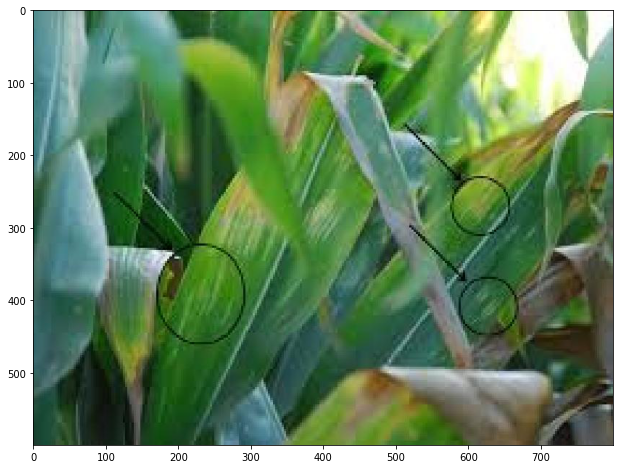

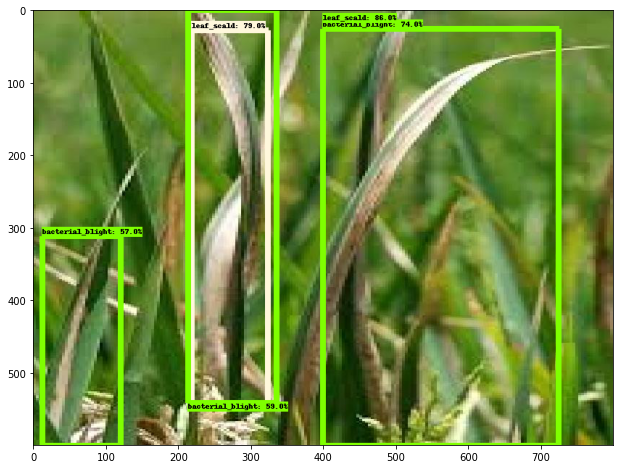

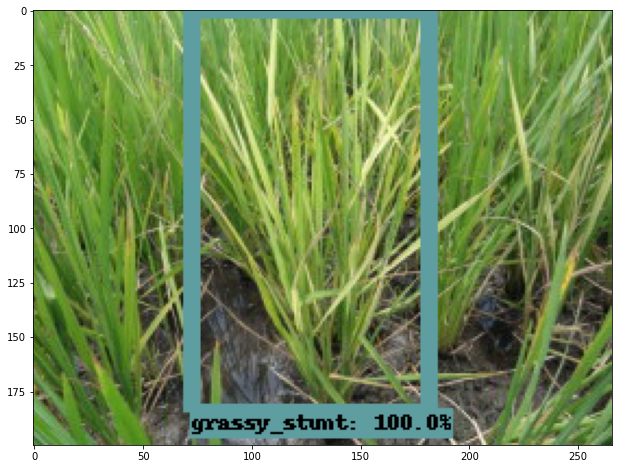

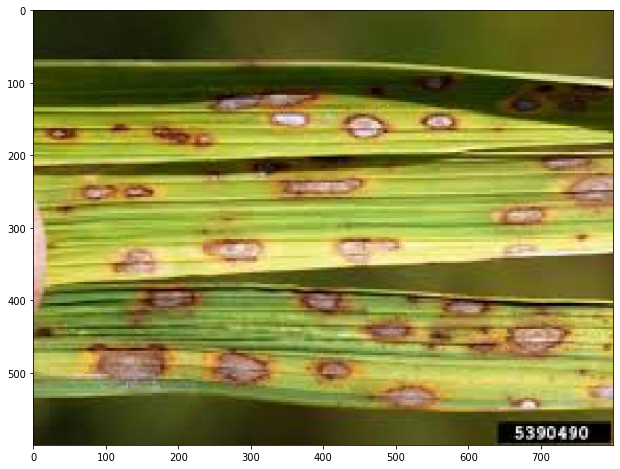

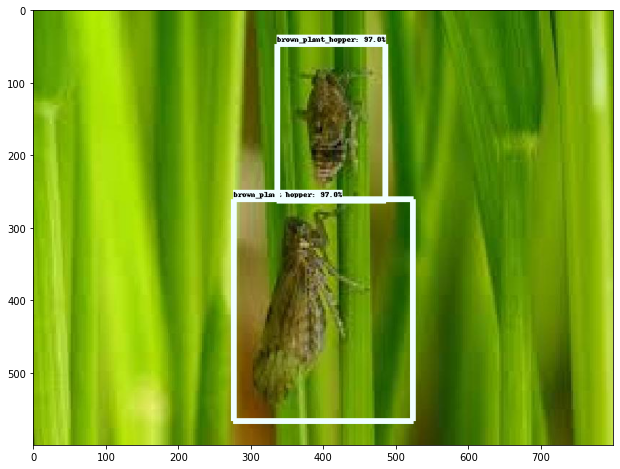

...

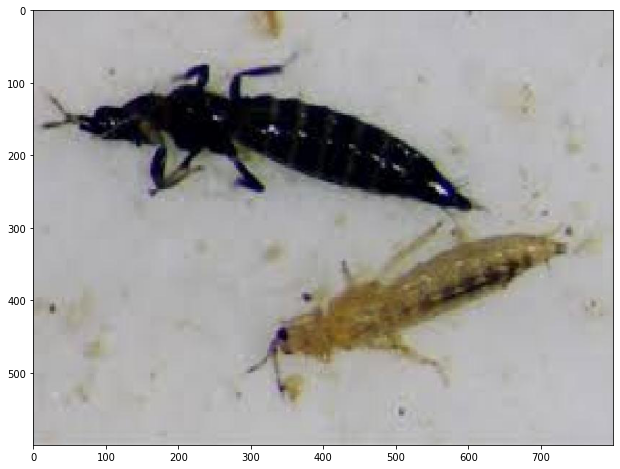

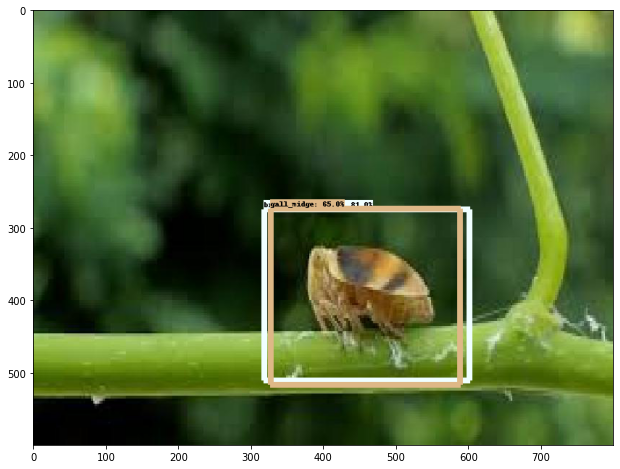

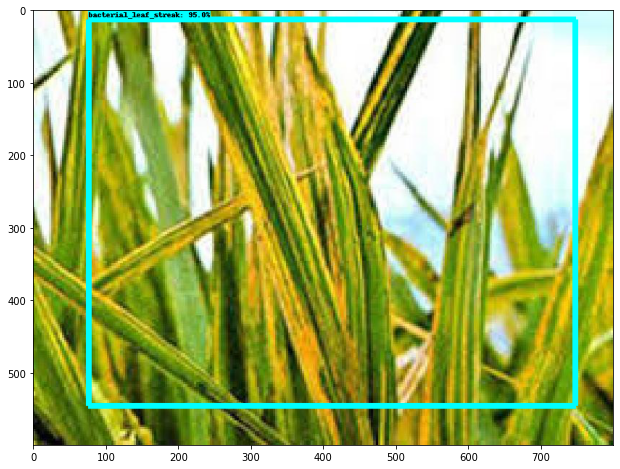

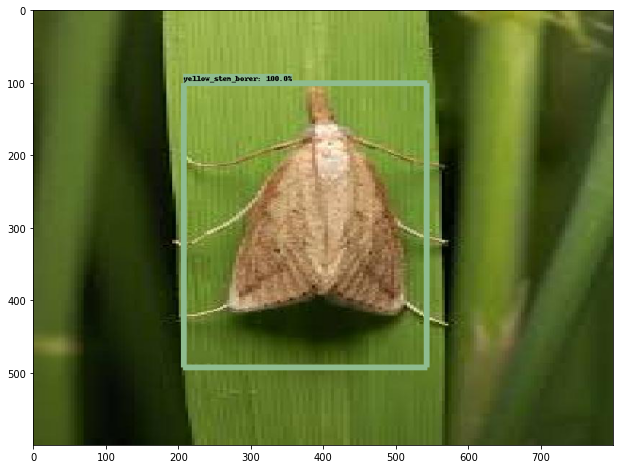

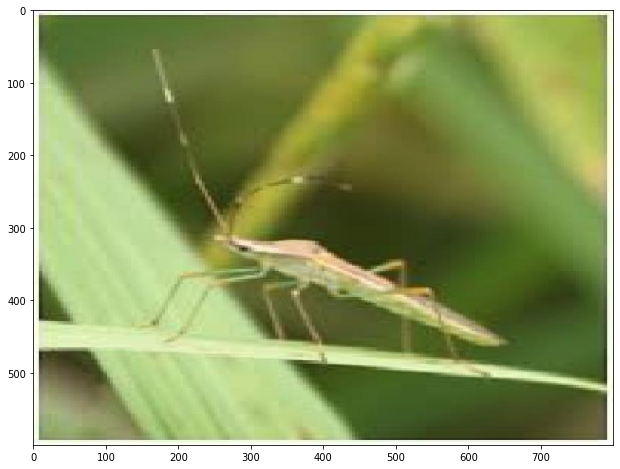

In [ ]:
%cd object_detection

import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image

# This is needed since the notebook is stored in the object_detection folder.
sys.path.append("..")
from object_detection.utils import ops as utils_ops


# This is needed to display the images.
%matplotlib inline


from object_detection.utils import label_map_util

from object_detection.utils import visualization_utils as vis_util


detection_graph = tf.Graph()
with detection_graph.as_default():
    od_graph_def = tf.GraphDef()
    with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
        serialized_graph = fid.read()
        od_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(od_graph_def, name='')


label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(
    label_map, max_num_classes=num_classes, use_display_name=True)
category_index = label_map_util.create_category_index(categories)


def load_image_into_numpy_array(image):
    (im_width, im_height) = image.size
    return np.array(image.getdata()).reshape(
        (im_height, im_width, 3)).astype(np.uint8)

# Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)


def run_inference_for_single_image(image, graph):
    with graph.as_default():
        with tf.Session() as sess:
            # Get handles to input and output tensors
            ops = tf.get_default_graph().get_operations()
            all_tensor_names = {
                output.name for op in ops for output in op.outputs}
            tensor_dict = {}
            for key in [
                'num_detections', 'detection_boxes', 'detection_scores',
                'detection_classes', 'detection_masks'
            ]:
                tensor_name = key + ':0'
                if tensor_name in all_tensor_names:
                    tensor_dict[key] = tf.get_default_graph().get_tensor_by_name(
                        tensor_name)
            if 'detection_masks' in tensor_dict:
                # The following processing is only for single image
                detection_boxes = tf.squeeze(
                    tensor_dict['detection_boxes'], [0])
                detection_masks = tf.squeeze(
                    tensor_dict['detection_masks'], [0])
                # Reframe is required to translate mask from box coordinates to image coordinates and fit the image size.
                real_num_detection = tf.cast(
                    tensor_dict['num_detections'][0], tf.int32)
                detection_boxes = tf.slice(detection_boxes, [0, 0], [
                                           real_num_detection, -1])
                detection_masks = tf.slice(detection_masks, [0, 0, 0], [
                                           real_num_detection, -1, -1])
                detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
                    detection_masks, detection_boxes, image.shape[0], image.shape[1])
                detection_masks_reframed = tf.cast(
                    tf.greater(detection_masks_reframed, 0.5), tf.uint8)
                # Follow the convention by adding back the batch dimension
                tensor_dict['detection_masks'] = tf.expand_dims(
                    detection_masks_reframed, 0)
            image_tensor = tf.get_default_graph().get_tensor_by_name('image_tensor:0')

            # Run inference
            output_dict = sess.run(tensor_dict,
                                   feed_dict={image_tensor: np.expand_dims(image, 0)})

            # all outputs are float32 numpy arrays, so convert types as appropriate
            output_dict['num_detections'] = int(
                output_dict['num_detections'][0])
            output_dict['detection_classes'] = output_dict[
                'detection_classes'][0].astype(np.uint8)
            output_dict['detection_boxes'] = output_dict['detection_boxes'][0]
            output_dict['detection_scores'] = output_dict['detection_scores'][0]
            if 'detection_masks' in output_dict:
                output_dict['detection_masks'] = output_dict['detection_masks'][0]
    return output_dict


for image_path in TEST_IMAGE_PATHS:
    image = Image.open(image_path)
    # the array based representation of the image will be used later in order to prepare the
    # result image with boxes and labels on it.
    image_np = load_image_into_numpy_array(image)
    # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
    image_np_expanded = np.expand_dims(image_np, axis=0)
    # Actual detection.
    output_dict = run_inference_for_single_image(image_np, detection_graph)
    # Visualization of the results of a detection.
    vis_util.visualize_boxes_and_labels_on_image_array(
        image_np,
        output_dict['detection_boxes'],
        output_dict['detection_classes'],
        output_dict['detection_scores'],
        category_index,
        instance_masks=output_dict.get('detection_masks'),
        use_normalized_coordinates=True,
        line_thickness=8)
    plt.figure(figsize=IMAGE_SIZE)
    plt.imshow(image_np)

In [ ]:
pipeline_fname

'/content/drive/My Drive/Colab Notebooks/olektra AI /projects/Currents projects/arginnovatice_rice/content/models/research/object_detection/samples/configs/ssd_mobilenet_v2_coco.config'

In [69]:
!python3 /content/drive/My\ Drive/Colab\ Notebooks/olektra\ AI\ /projects/Currents\ projects/arginnovatice_rice/content/models/research/object_detection/export_tflite_ssd_graph.py --pipeline_config_path=/content/drive/My\ Drive/Colab\ Notebooks/olektra\ AI\ /projects/Currents\ projects/arginnovatice_rice//content/models/research/object_detection/samples/configs/ssd_mobilenet_v2_coco.config --trained_checkpoint_prefix='/content/drive/My Drive/Colab Notebooks/olektra AI /projects/Currents projects/arginnovatice_rice/content/models/research/training/model.ckpt-558652' --output_directory='/content/' --add_postprocessing_op=True --max_detections=10

Instructions for updating:
Please use `layer.__call__` method instead.
W0928 09:35:58.247589 140547415246720 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tf_slim/layers/layers.py:1089: Layer.apply (from tensorflow.python.keras.engine.base_layer) is deprecated and will be removed in a future version.
Instructions for updating:
Please use `layer.__call__` method instead.
INFO:tensorflow:depth of additional conv before box predictor: 0
I0928 09:36:00.220428 140547415246720 convolutional_box_predictor.py:156] depth of additional conv before box predictor: 0
INFO:tensorflow:depth of additional conv before box predictor: 0
I0928 09:36:00.250142 140547415246720 convolutional_box_predictor.py:156] depth of additional conv before box predictor: 0
INFO:tensorflow:depth of additional conv before box predictor: 0
I0928 09:36:00.278422 140547415246720 convolutional_box_predictor.py:156] depth of additional conv before box predictor: 0
INFO:tensorflow:depth of additional conv befo

In [70]:
!toco \
 --graph_def_file='/content/tflite_graph.pb' \
 --output_file='/content/rice_ai_v11.tflite' \
 --input_shapes=1,300,300,3 \
 --input_arrays=normalized_input_image_tensor \
 --output_arrays='TFLite_Detection_PostProcess','TFLite_Detection_PostProcess:1','TFLite_Detection_PostProcess:2','TFLite_Detection_PostProcess:3' \
 --inference_type=FLOAT \
 --allow_custom_ops

2020-09-28 09:36:06.392432: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2020-09-28 09:36:06.425783: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:983] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-09-28 09:36:06.426367: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: Tesla T4 major: 7 minor: 5 memoryClockRate(GHz): 1.59
pciBusID: 0000:00:04.0
2020-09-28 09:36:06.426614: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2020-09-28 09:36:06.427702: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10.0
2020-09-28 09:36:06.428946: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcufft.so.10.0
2